**Autores**

*   [182999] Federico Alonso


# Práctico 3: Modelo de clasificacion - Decision Tree

## Librerías

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# from google.colab import drive, files
from sklearn import tree
import seaborn as sns

# google colab
# !pip install matplotlib scikit-learn pandas
# !pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
#Puede ser necesario reiniciar el kernel. van a Runtime > Restart Runtime

# local
# !pip install matplotlib scikit-learn pandas pandas-profiling

## Carga de datos

In [20]:
# Carga de los datos (desde drive)
# drive.mount('/content/drive', force_remount=True)

df = pd.read_csv("./tennis.csv", sep = ",")

## Análisis

In [21]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Eliminamos la variable "Day", es un identificador 100% distinto que no nos aporta valor.

In [22]:
df = df.drop('Day', axis=1)

In [23]:
df

,Outlook,Temp,Humidity,Wind,Tennis
0,Sunny,Hot,High,Weak,No
1,Sunny,Hot,High,Strong,No
2,Overcast,Hot,High,Weak,Yes
3,Rain,Mild,High,Weak,Yes
4,Rain,Cool,Normal,Weak,Yes
5,Rain,Cool,Normal,Strong,No
6,Overcast,Cool,Normal,Strong,Yes
7,Sunny,Mild,High,Weak,No
8,Sunny,Cool,Normal,Weak,Yes
9,Rain,Mild,Normal,Weak,Yes


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Outlook   14 non-null     object
 1   Temp      14 non-null     object
 2   Humidity  14 non-null     object
 3   Wind      14 non-null     object
 4   Tennis    14 non-null     object
dtypes: object(5)
memory usage: 688.0+ bytes


Todas las variables son categóricas (a excepción de la variable a predecir), por lo tanto, hacemos OneHotEncoding.

In [25]:
describedDF = df.describe()

In [26]:
describedDF.transpose()

,count,unique,top,freq
Outlook,14,3,Sunny,5
Temp,14,3,Mild,6
Humidity,14,2,High,7
Wind,14,2,Weak,8
Tennis,14,2,Yes,9


In [27]:
df_dummy = pd.get_dummies(df, drop_first=True)

In [28]:
df_dummy

,Outlook_Rain,Outlook_Sunny,Temp_Hot,Temp_Mild,Humidity_Normal,Wind_Weak,Tennis_Yes
0,0,1,1,0,0,1,0
1,0,1,1,0,0,0,0
2,0,0,1,0,0,1,1
3,1,0,0,1,0,1,1
4,1,0,0,0,1,1,1
5,1,0,0,0,1,0,0
6,0,0,0,0,1,0,1
7,0,1,0,1,0,1,0
8,0,1,0,0,1,1,1
9,1,0,0,1,1,1,1


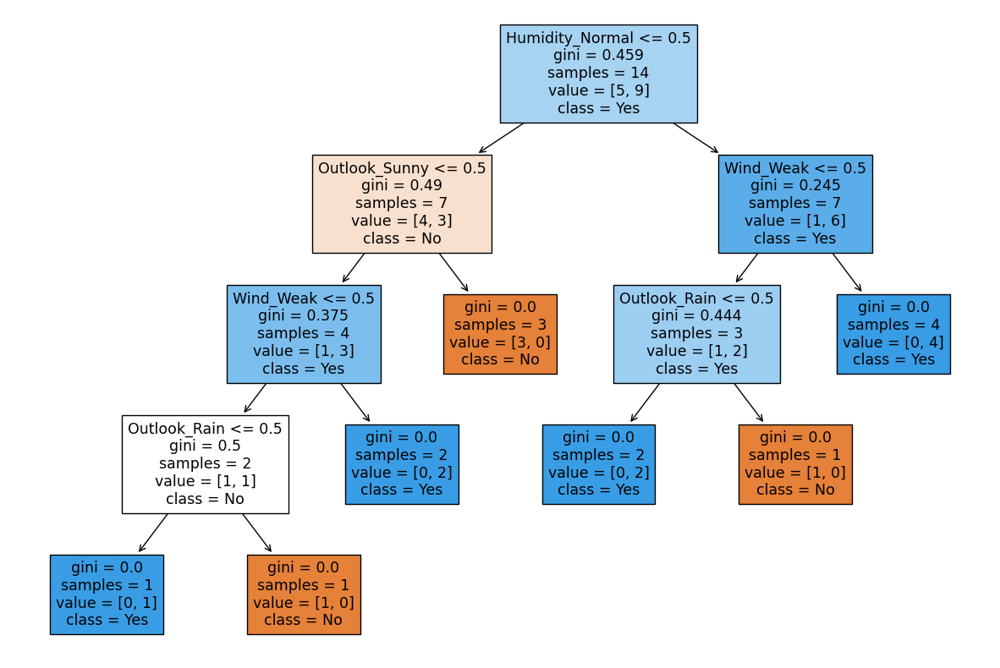

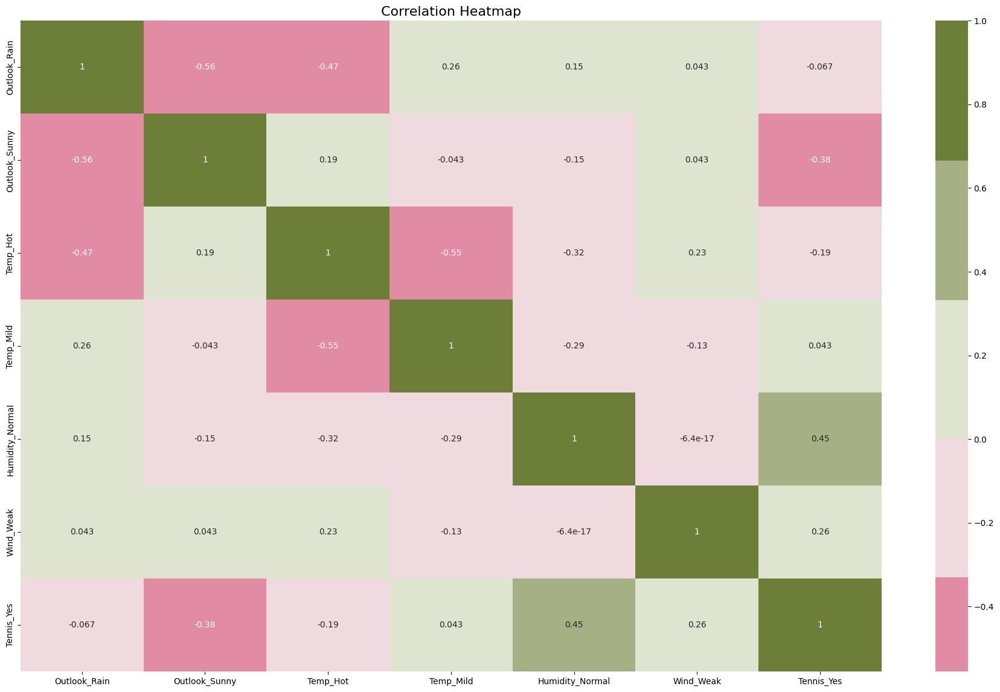

In [29]:
# Esta línea solo debe descomentarse si los plots no se dibujan correctamente
#%matplotlib inline

plt.figure(figsize = (23, 14))
cmap = sns.diverging_palette(0, 100, sep = 20)
sns.heatmap(df_dummy.corr(), annot = True, cmap = cmap, center = 0).set_title("Correlation Heatmap", fontsize = 16)
plt.show()

## Clasificación

Para este problema de ejemplo vamos a entrenar un modelo sencillo basado en [Árboles de Decisión](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html).

Los árboles de decision son algoritmos de Machine Learning supervisado. Se construye un arbol binario (cada nodo tiene dos ramas). Los valores objetivos se presentan en las hojas de los arboles.

Pero antes de poder llegar a eso debemos dividir el dataset en conjuntos adecuados para **entrenar** y **testar** el modelo.

Nos guardamos en data_x las features predictoras y en data_y la variable a predecir

In [30]:
data_x = df_dummy.drop('Tennis_Yes', axis=1)
data_y = df_dummy['Tennis_Yes']

### Entrenamiento

In [31]:
arbol_default = tree.DecisionTreeClassifier() 
arbol_default.fit(data_x, data_y)

DecisionTreeClassifier()

### Visualización del árbol

Para obtener cual class names es mayor y saber cual va primero

In [32]:
df_dummy.Tennis_Yes.value_counts()

1    9
0    5
Name: Tennis_Yes, dtype: int64

In [33]:
fig = plt.figure(figsize=(15,10))
tree.plot_tree(arbol_default, feature_names=df_dummy.columns, class_names=["No","Yes"], filled=True)

[Text(0.5555555555555556, 0.9, 'Humidity_Normal <= 0.5\ngini = 0.459\nsamples = 14\nvalue = [5, 9]\nclass = Yes'),
 Text(0.3333333333333333, 0.7, 'Outlook_Sunny <= 0.5\ngini = 0.49\nsamples = 7\nvalue = [4, 3]\nclass = No'),
 Text(0.2222222222222222, 0.5, 'Outlook_Rain <= 0.5\ngini = 0.375\nsamples = 4\nvalue = [1, 3]\nclass = Yes'),
 Text(0.1111111111111111, 0.3, 'gini = 0.0\nsamples = 2\nvalue = [0, 2]\nclass = Yes'),
 Text(0.3333333333333333, 0.3, 'Wind_Weak <= 0.5\ngini = 0.5\nsamples = 2\nvalue = [1, 1]\nclass = No'),
 Text(0.2222222222222222, 0.1, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]\nclass = No'),
 Text(0.4444444444444444, 0.1, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]\nclass = Yes'),
 Text(0.4444444444444444, 0.5, 'gini = 0.0\nsamples = 3\nvalue = [3, 0]\nclass = No'),
 Text(0.7777777777777778, 0.7, 'Wind_Weak <= 0.5\ngini = 0.245\nsamples = 7\nvalue = [1, 6]\nclass = Yes'),
 Text(0.6666666666666666, 0.5, 'Outlook_Rain <= 0.5\ngini = 0.444\nsamples = 3\nvalue = [1, 2]\nclass

Podemos ver la importancia relativa de cada feature, calculada en el árbol para el criterio Gini (criterio por defecto)

In [34]:
importances = pd.DataFrame(arbol_default.feature_importances_.reshape(1,-1), columns=data_x.columns, index = ["importancia"])
importances

,Outlook_Rain,Outlook_Sunny,Temp_Hot,Temp_Mild,Humidity_Normal,Wind_Weak
importancia,0.285185,0.3,0.0,0.0,0.2,0.214815


Entreanamos otro árbol, ajustando algunos hiperparámetros

In [35]:
arbol_entropy = tree.DecisionTreeClassifier(criterion="entropy", max_depth=2) 
arbol_entropy.fit(data_x, data_y)

DecisionTreeClassifier(criterion='entropy', max_depth=2)

In [36]:
fig = plt.figure(figsize=(15,10))
tree.plot_tree(arbol_entropy, feature_names=df_dummy.columns, class_names=["No","Yes"], filled=True)

[Text(0.5, 0.8333333333333334, 'Humidity_Normal <= 0.5\nentropy = 0.94\nsamples = 14\nvalue = [5, 9]\nclass = Yes'),
 Text(0.25, 0.5, 'Outlook_Sunny <= 0.5\nentropy = 0.985\nsamples = 7\nvalue = [4, 3]\nclass = No'),
 Text(0.125, 0.16666666666666666, 'entropy = 0.811\nsamples = 4\nvalue = [1, 3]\nclass = Yes'),
 Text(0.375, 0.16666666666666666, 'entropy = 0.0\nsamples = 3\nvalue = [3, 0]\nclass = No'),
 Text(0.75, 0.5, 'Outlook_Rain <= 0.5\nentropy = 0.592\nsamples = 7\nvalue = [1, 6]\nclass = Yes'),
 Text(0.625, 0.16666666666666666, 'entropy = 0.0\nsamples = 4\nvalue = [0, 4]\nclass = Yes'),
 Text(0.875, 0.16666666666666666, 'entropy = 0.918\nsamples = 3\nvalue = [1, 2]\nclass = Yes')]

### Ejercicio 1
En base a lo visto en el teórico, ¿qué proceso MUY importante nos está faltando aplicar antes de entrenar nuestro modelo?

Lo uqe falta en el ejercicio es haber separado una porción de datos para Test y otra para el Train. En este caso no podremos corroborar que tan bien generaliza nuestro modelo.

### Matriz de confusion

In [40]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(arbol_default, data_x, data_y) 

/home/fedrico/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


In [41]:
plot_confusion_matrix(arbol_entropy, data_x, data_y) 

/home/fedrico/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


### Ejercicio 2
Hacer una funcion que mida la accuracy de su modelo, luego compare el resultado con lo mismo calculado por sklearn.

Accuracy: que porcentaje de los datos fueron clasificados correctamente?

**Debe ajustar la siguiente función**

In [42]:
def calculate_accuracy(un_arbol, X_test, y_test):
    assert len(X_test) == len(y_test), 'X_test must be the same length as y_test'

    elementsCount = len(y_test)
    tp = 0
    tn = 0
    fp = 0
    fn = 0
    Y_pred = un_arbol.predict(X_test)

    for i in range(elementsCount):
        if(Y_pred[i] == 1):
            if(Y_pred[i] == y_test[i]):
                tp += 1
            else:
                fp += 1
        else:
            if(Y_pred[i] == y_test[i]):
                tn += 1
            else:
                fn += 1
    return (tp + tn) / (tn + fn + tp + fp)

In [43]:
# Técnica A
print("Técnica A - Árbol Entropy:", calculate_accuracy(arbol_entropy, data_x, data_y))

# Técnica B
from sklearn.metrics import accuracy_score
Y_pred = arbol_entropy.predict(data_x)
print("Técnica B - Árbol Entropy:", accuracy_score(Y_pred, data_y))

Técnica A - Árbol Entropy: 0.8571428571428571
Técnica B - Árbol Entropy: 0.8571428571428571


## Ejercicios - Nuevo dataset

La siguiente tarea implica el uso de un dataset real para el cual van a tener que entrenar un Árbol de decisión para detectar cáncer de mama a partir de distintas mediciones. 

La descripción del dataset la pueden encontrar aquí: https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+%28Original%29

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [100]:
breast_cancer_df=pd.read_csv("./breast-cancer-wisconsin.csv", header = None,sep = ",")
breast_cancer_df.head()

,0,1,2,3,4,5,6,7,8,9,10
0,1000025,5,1,1,1,2,1,3,1,1,2
1,1002945,5,4,4,5,7,10,3,2,1,2
2,1015425,3,1,1,1,2,2,3,1,1,2
3,1016277,6,8,8,1,3,4,3,7,1,2
4,1017023,4,1,1,3,2,1,3,1,1,2


Otra forma de traer el dataset, descargarlo con wget y luego importarlo

In [ ]:
# Descargo dataset
# ! wget -O breast_cancer.csv https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/breast-cancer-wisconsin.data

# column_names = ["Id", "clump_thicknes", "cell_size", "cell_shape", "adhesion", "epithelial_cell_size", "nuclei", "chromatin", "nucleoli", "mitoses", "target"]
# breast_cancer_df_other = pd.read_csv("breast_cancer.csv", header = None, names = column_names)

--2022-09-03 22:17:47--  https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/breast-cancer-wisconsin.data
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19889 (19K) [application/x-httpd-php]
Saving to: ‘breast_cancer.csv’

breast_cancer.csv   100%[===================>]  19.42K  --.-KB/s    in 0.05s   

2022-09-03 22:17:47 (399 KB/s) - ‘breast_cancer.csv’ saved [19889/19889]



In [101]:
breast_cancer_df.columns = ["Id", "clump_thicknes", "cell_size", "cell_shape", "adhesion", "epithelial_cell_size", "nuclei", "chromatin", "nucleoli", "mitoses", "target"]
breast_cancer_df.head()

,Id,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target
0,1000025,5,1,1,1,2,1,3,1,1,2
1,1002945,5,4,4,5,7,10,3,2,1,2
2,1015425,3,1,1,1,2,2,3,1,1,2
3,1016277,6,8,8,1,3,4,3,7,1,2
4,1017023,4,1,1,3,2,1,3,1,1,2


In [102]:
# En el dataset las clases son 2 y 4 que representan "benigno" y "maligno" respectivamente, vamos a reemplazarlas por 0 y 1 por simplicidad.
breast_cancer_df["target"].replace(2, 0, inplace=True)
breast_cancer_df["target"].replace(4, 1, inplace=True)

# 2 era cancer benigno (ahora es 0)
# 4 era cancer maligno (ahora es 1)

La columna "Id" no aporta valor, podemos trabajarlo de distintas maneras

In [103]:
# Opcion A) Eliminamos la columna de ID ya que no nos interesa
breast_cancer_df.drop(columns="Id", inplace=True)

# Opcion B) Hacemos que el ID sea el Index
#breast_cancer_df.set_index("Id", inplace = True)
breast_cancer_df.head()

,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target
0,5,1,1,1,2,1,3,1,1,0
1,5,4,4,5,7,10,3,2,1,0
2,3,1,1,1,2,2,3,1,1,0
3,6,8,8,1,3,4,3,7,1,0
4,4,1,1,3,2,1,3,1,1,0


In [104]:
# Finalmente, contamos cuantos ejemplos son beningnos y cuantos no (0 = B, 1 = M)
breast_cancer_df.target.value_counts()

0    458
1    241
Name: target, dtype: int64

Es recomendable ver que valores toma cada variable, quizá no hay Null o NaN, pero si hay valores inconsistentes

In [105]:
breast_cancer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 699 entries, 0 to 698
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   clump_thicknes        699 non-null    int64 
 1   cell_size             699 non-null    int64 
 2   cell_shape            699 non-null    int64 
 3   adhesion              699 non-null    int64 
 4   epithelial_cell_size  699 non-null    int64 
 5   nuclei                699 non-null    object
 6   chromatin             699 non-null    int64 
 7   nucleoli              699 non-null    int64 
 8   mitoses               699 non-null    int64 
 9   target                699 non-null    int64 
dtypes: int64(9), object(1)
memory usage: 54.7+ KB


In [ ]:
#for col in breast_cancer_df.columns:
#  print(breast_cancer_df[col].value_counts(),"\n")

In [79]:
breast_cancer_df["nuclei"].value_counts()

1     402
10    132
2      30
5      30
3      28
8      21
4      19
?      16
9       9
7       8
6       4
Name: nuclei, dtype: int64

In [106]:
breast_cancer_df[breast_cancer_df["nuclei"]=='?']

,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target
23,8,4,5,1,2,?,7,3,1,1
40,6,6,6,9,6,?,7,8,1,0
139,1,1,1,1,1,?,2,1,1,0
145,1,1,3,1,2,?,2,1,1,0
158,1,1,2,1,3,?,1,1,1,0
164,5,1,1,1,2,?,3,1,1,0
235,3,1,4,1,2,?,3,1,1,0
249,3,1,1,1,2,?,3,1,1,0
275,3,1,3,1,2,?,2,1,1,0
292,8,8,8,1,2,?,6,10,1,1


### Ejercicio 3:  
Tratar las observaciones que tienen "?" como valor en el "nuclei". Explique por qué utilizó el método que haya decidido.

**Puede ayudarse de la siguiente función**

In [107]:
breast_cancer_df.nuclei.apply(lambda x: np.nan if x == '?' else x)

0       1
1      10
2       2
3       4
4       1
       ..
694     2
695     1
696     3
697     4
698     5
Name: nuclei, Length: 699, dtype: object

In [108]:
breast_cancer_df.nuclei = breast_cancer_df.nuclei.apply(lambda x: np.nan if x == '?' else x)

In [109]:
breast_cancer_df[breast_cancer_df["nuclei"]=='?']

,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target


In [110]:
breast_cancer_df

,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target
0,5,1,1,1,2,1,3,1,1,0
1,5,4,4,5,7,10,3,2,1,0
2,3,1,1,1,2,2,3,1,1,0
3,6,8,8,1,3,4,3,7,1,0
4,4,1,1,3,2,1,3,1,1,0
...,...,...,...,...,...,...,...,...,...,...
694,3,1,1,1,3,2,1,1,1,0
695,2,1,1,1,2,1,1,1,1,0
696,5,10,10,3,7,3,8,10,2,1
697,4,8,6,4,3,4,10,6,1,1


Ahora los ? son nulos, ahora vamos a ver la opcion mejor

In [111]:
breast_cancer_df.nuclei.info()

<class 'pandas.core.series.Series'>
RangeIndex: 699 entries, 0 to 698
Series name: nuclei
Non-Null Count  Dtype 
--------------  ----- 
683 non-null    object
dtypes: object(1)
memory usage: 5.6+ KB


In [112]:
breast_cancer_df_aux = breast_cancer_df.isnull()
breast_cancer_df_aux.any()

clump_thicknes          False
cell_size               False
cell_shape              False
adhesion                False
epithelial_cell_size    False
nuclei                   True
chromatin               False
nucleoli                False
mitoses                 False
target                  False
dtype: bool

In [113]:
breast_cancer_df[breast_cancer_df.nuclei.isnull()]

,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target
23,8,4,5,1,2,NaN,7,3,1,1
40,6,6,6,9,6,NaN,7,8,1,0
139,1,1,1,1,1,NaN,2,1,1,0
145,1,1,3,1,2,NaN,2,1,1,0
158,1,1,2,1,3,NaN,1,1,1,0
164,5,1,1,1,2,NaN,3,1,1,0
235,3,1,4,1,2,NaN,3,1,1,0
249,3,1,1,1,2,NaN,3,1,1,0
275,3,1,3,1,2,NaN,2,1,1,0
292,8,8,8,1,2,NaN,6,10,1,1


In [114]:
cantidad = len(breast_cancer_df[breast_cancer_df.nuclei.isnull()])
porcentaje = cantidad * 100 / len(breast_cancer_df)
porcentaje

2.2889842632331905

Ar ser sólo 2,2% procederemos a eliminarlos.

In [115]:
breast_cancer_df_drop = breast_cancer_df.dropna()
breast_cancer_df_drop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 683 entries, 0 to 698
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   clump_thicknes        683 non-null    int64 
 1   cell_size             683 non-null    int64 
 2   cell_shape            683 non-null    int64 
 3   adhesion              683 non-null    int64 
 4   epithelial_cell_size  683 non-null    int64 
 5   nuclei                683 non-null    object
 6   chromatin             683 non-null    int64 
 7   nucleoli              683 non-null    int64 
 8   mitoses               683 non-null    int64 
 9   target                683 non-null    int64 
dtypes: int64(9), object(1)
memory usage: 58.7+ KB


In [117]:
breast_cancer_df_drop_aux = breast_cancer_df_drop.isnull()
breast_cancer_df_drop_aux.any()

clump_thicknes          False
cell_size               False
cell_shape              False
adhesion                False
epithelial_cell_size    False
nuclei                  False
chromatin               False
nucleoli                False
mitoses                 False
target                  False
dtype: bool

Otro dataset con fillna para probar luego y comparar ambos

In [94]:
breast_cancer_df_fill = breast_cancer_df.fillna(method = "ffill")
breast_cancer_df_fill.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 699 entries, 0 to 698
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   clump_thicknes        699 non-null    int64 
 1   cell_size             699 non-null    int64 
 2   cell_shape            699 non-null    int64 
 3   adhesion              699 non-null    int64 
 4   epithelial_cell_size  699 non-null    int64 
 5   nuclei                699 non-null    object
 6   chromatin             699 non-null    int64 
 7   nucleoli              699 non-null    int64 
 8   mitoses               699 non-null    int64 
 9   target                699 non-null    int64 
dtypes: int64(9), object(1)
memory usage: 54.7+ KB


In [118]:
breast_cancer_df_fill_aux = breast_cancer_df_fill.isnull()
breast_cancer_df_fill_aux.any()

clump_thicknes          False
cell_size               False
cell_shape              False
adhesion                False
epithelial_cell_size    False
nuclei                  False
chromatin               False
nucleoli                False
mitoses                 False
target                  False
dtype: bool

### Ejercicio 4  
**Análisis Exploratorio**

Realice un análisis exploratorio de los datos para contestar mínimamente lo siguiente:

1.   ¿Cuantos registros tiene el dataset? 
2.   ¿Cuantos features existen y de que tipo son? ¿Habría que modificar alguno?
3.   ¿Cuantos registros hay Benignos (0) y Malignos (1)?
4.   ¿Existen variables correlacionadas? Si es así, realice las modificaciones que crea pertinente
5.   ¿Es necesario utilizar one hot enconding? ¿Por qué?
6.   ¿Es necesario realizar feature scaling? ¿Por qué?
7.   ¿La media de las variables es diferente según si el registro es bengino o maligno?
8.   Grafique las variables separando registros bengignos vs malignos

In [120]:
breast_cancer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 699 entries, 0 to 698
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   clump_thicknes        699 non-null    int64 
 1   cell_size             699 non-null    int64 
 2   cell_shape            699 non-null    int64 
 3   adhesion              699 non-null    int64 
 4   epithelial_cell_size  699 non-null    int64 
 5   nuclei                683 non-null    object
 6   chromatin             699 non-null    int64 
 7   nucleoli              699 non-null    int64 
 8   mitoses               699 non-null    int64 
 9   target                699 non-null    int64 
dtypes: int64(9), object(1)
memory usage: 54.7+ KB


1.   ¿Cuantos registros tiene el dataset? 
2.   ¿Cuantos features existen y de que tipo son? ¿Habría que modificar alguno?

El dataset tiene 699 registros, y 10 features, en realidad 11 pero quitamos el ID que no aporta al ejercicio.

Los tipos de datos de estos features son numericos, y el unico que contiene nulos es nuclei, (16 registros), que los vimos en el ejercicio anterior y decidimos eliminarlo por ser de 2.2% del total. En un principio tenia '?' en lugar de nan, perod dicho valor ya fue cambiado en el ejercicio anterior, por lo que podremos modificar su tipo a int64.

In [122]:
breast_cancer_df_drop.nuclei = breast_cancer_df_drop.nuclei.astype('int64')
breast_cancer_df_drop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 683 entries, 0 to 698
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   clump_thicknes        683 non-null    int64
 1   cell_size             683 non-null    int64
 2   cell_shape            683 non-null    int64
 3   adhesion              683 non-null    int64
 4   epithelial_cell_size  683 non-null    int64
 5   nuclei                683 non-null    int64
 6   chromatin             683 non-null    int64
 7   nucleoli              683 non-null    int64
 8   mitoses               683 non-null    int64
 9   target                683 non-null    int64
dtypes: int64(10)
memory usage: 58.7 KB


/tmp/ipykernel_13825/2251663506.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  breast_cancer_df_drop.nuclei = breast_cancer_df_drop.nuclei.astype('int64')


In [123]:
# 3.   ¿Cuantos registros hay Benignos (0) y Malignos (1)?
breast_cancer_df.target.value_counts()

0    458
1    241
Name: target, dtype: int64

Existen 458 Benignos y 241 Malignos.

In [130]:
# 4.   ¿Existen variables correlacionadas? Si es así, realice las modificaciones que crea pertinente
cmap = sns.diverging_palette(0, 100, sep = 20)
sns.heatmap(breast_cancer_df.corr(), annot = True, cmap = cmap, center = 0).set_title("Correlation Heatmap", fontsize = 16)

Text(0.5, 1.0, 'Correlation Heatmap')

5.   ¿Es necesario utilizar one hot enconding? ¿Por qué?

No es necesario, debido a que no tenemos variables discretas para parar a numericas, todas son numericas

In [131]:
# 6.   ¿Es necesario realizar feature scaling? ¿Por qué?
breast_cancer_df.head(10)

,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target
0,5,1,1,1,2,1,3,1,1,0
1,5,4,4,5,7,10,3,2,1,0
2,3,1,1,1,2,2,3,1,1,0
3,6,8,8,1,3,4,3,7,1,0
4,4,1,1,3,2,1,3,1,1,0
5,8,10,10,8,7,10,9,7,1,1
6,1,1,1,1,2,10,3,1,1,0
7,2,1,2,1,2,1,3,1,1,0
8,2,1,1,1,2,1,1,1,5,0
9,4,2,1,1,2,1,2,1,1,0


In [142]:
print("clump_thicknes")
print(breast_cancer_df.clump_thicknes.describe())
print('\n-------------------------\n')
print("cell_size")
print(breast_cancer_df.cell_size.describe())

clump_thicknes
count    699.000000
mean       4.417740
std        2.815741
min        1.000000
25%        2.000000
50%        4.000000
75%        6.000000
max       10.000000
Name: clump_thicknes, dtype: float64

-------------------------

cell_size
count    699.000000
mean       3.134478
std        3.051459
min        1.000000
25%        1.000000
50%        1.000000
75%        5.000000
max       10.000000
Name: cell_size, dtype: float64


In [143]:

print("cell_shape")
print(breast_cancer_df.cell_shape.describe())
print('\n-------------------------\n')
print("adhesion")
print(breast_cancer_df.adhesion.describe())

cell_shape
count    699.000000
mean       3.207439
std        2.971913
min        1.000000
25%        1.000000
50%        1.000000
75%        5.000000
max       10.000000
Name: cell_shape, dtype: float64

-------------------------

adhesion
count    699.000000
mean       2.806867
std        2.855379
min        1.000000
25%        1.000000
50%        1.000000
75%        4.000000
max       10.000000
Name: adhesion, dtype: float64


In [145]:
print("epithelial_cell_size")
print(breast_cancer_df.epithelial_cell_size.describe())
print('\n-------------------------\n')
print("nuclei")
print(breast_cancer_df.nuclei.describe())

epithelial_cell_size
count    699.000000
mean       3.216023
std        2.214300
min        1.000000
25%        2.000000
50%        2.000000
75%        4.000000
max       10.000000
Name: epithelial_cell_size, dtype: float64

-------------------------

nuclei
count     683
unique     10
top         1
freq      402
Name: nuclei, dtype: object


In [146]:
print("chromatin")
print(breast_cancer_df.chromatin.describe())
print('\n-------------------------\n')
print("nucleoli")
print(breast_cancer_df.nucleoli.describe())

chromatin
count    699.000000
mean       3.437768
std        2.438364
min        1.000000
25%        2.000000
50%        3.000000
75%        5.000000
max       10.000000
Name: chromatin, dtype: float64

-------------------------

nucleoli
count    699.000000
mean       2.866953
std        3.053634
min        1.000000
25%        1.000000
50%        1.000000
75%        4.000000
max       10.000000
Name: nucleoli, dtype: float64


In [147]:

print("mitoses")
print(breast_cancer_df.mitoses.describe())

mitoses
count    699.000000
mean       1.589413
std        1.715078
min        1.000000
25%        1.000000
50%        1.000000
75%        1.000000
max       10.000000
Name: mitoses, dtype: float64


No es necesario hacer Feature Scaling, ya que todos los datos se encuentran escalados entre 0 y 10.

In [148]:
# 7.   ¿La media de las variables es diferente según si el registro es bengino o maligno?
med = breast_cancer_df_drop.groupby('target').mean()
med

,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses
target,,,,,,,,,
0,2.963964,1.306306,1.414414,1.346847,2.108108,1.346847,2.083333,1.261261,1.065315
1,7.188285,6.577406,6.560669,5.585774,5.326360,7.627615,5.974895,5.857741,2.602510


Si, es diferente la media de las variables segun el target. Esto nos puede adelantar que los registros malignos pueden llegar a tener valores mas altos.

In [149]:
median = breast_cancer_df_drop.groupby('target').median()
median

,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses
target,,,,,,,,,
0,3.0,1.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0
1,8.0,6.0,6.0,5.0,5.0,10.0,7.0,6.0,1.0


Con respecto a la mediana podemos ver un valor mas robusto en cuanto a los outliers, vemos por ejemplo que nuclei es de 10, el maximo, y mitoses es igual en casos malignos y benignos.

In [158]:
# plt.figure(figsize=(18,8))
# sns.boxplot(y = 'Valor', x = 'Features', data = breast_cancer_df_drop)
# plt.figure(figsize=(3,5))
# sns.boxplot(y = 'nuclei', data = breast_cancer_df_drop)

# sns.pairplot(breast_cancer_df_drop[['clump_thicknes','cell_size','cell_shape','adhesion','epithelial_cell_size','nuclei','chromatin','nucleoli','mitoses']], hue='target', height=2.5)
sns.pairplot(breast_cancer_df_drop[['clump_thicknes','cell_size']], hue='target')

KeyError: 'target'

In [ ]:

# 8.   Grafique las variables separando registros bengignos vs malignos

### Dejo lo que hicimos en clase para no perderlo y al final voy a aplicar los cambios

In [159]:
# Se espera más que solo hacer PandasProfile

profile = ProfileReport(breast_cancer_df)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [161]:
# En PandasProfiling veo varias celdas duplicadas, las trabajo

# Da False la primera ocurrencia de una duplicada
print(breast_cancer_df.duplicated(keep='first').value_counts(), "\n")

# Da True la última ocurrencia de una duplicada
print(breast_cancer_df.duplicated(keep='last').value_counts(), "\n")

breast_cancer_df_duplicated_rows = breast_cancer_df[breast_cancer_df.duplicated(keep='first')]
len(breast_cancer_df_duplicated_rows)

False    463
True     236
dtype: int64 

False    463
True     236
dtype: int64 



236

In [162]:
# En realidad PandasProfiling indica 48 duplicadas. Parece indicar las duplicadas distintas solamente, pero hay muchas que se repiten
breast_cancer_df_duplicated_rows.duplicated(keep='first').value_counts()

True     188
False     48
dtype: int64

In [163]:
breast_cancer_df_duplicated_rows.head()

,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target
28,2,1,1,1,2,1,2,1,1,0
35,2,1,1,1,2,1,2,1,1,0
48,4,1,1,3,2,1,3,1,1,0
64,1,1,1,1,2,1,2,1,1,0
66,4,1,1,1,2,1,3,1,1,0


In [164]:
breast_cancer_df_duplicated_rows.index

Int64Index([ 28,  35,  48,  64,  66,  88,  90,  92,  93,  94,
            ...
            678, 679, 683, 684, 685, 686, 688, 690, 692, 695],
           dtype='int64', length=236)

In [165]:
breast_cancer_df_without_duplicates = breast_cancer_df.drop(breast_cancer_df_duplicated_rows.index, axis=0, inplace=False)

In [166]:
breast_cancer_df_without_duplicates.shape

(463, 10)

In [167]:
breast_cancer_df_without_duplicates.duplicated(keep='first').value_counts()

False    463
dtype: int64

In [168]:
# Otra forma, más sencilla
breast_cancer_df_without_duplicates2 = breast_cancer_df.drop_duplicates(keep='first')
breast_cancer_df_without_duplicates2.shape

(463, 10)

El mapa de correlación se ve fuertemente modificado al eliminar duplicados, eran muchos

In [169]:
cmap = sns.diverging_palette(0, 100, sep = 20)
sns.heatmap(breast_cancer_df_without_duplicates2.corr(), annot = True, cmap = cmap, center = 0).set_title("Correlation Heatmap", fontsize = 16)

Text(0.5, 1.0, 'Correlation Heatmap')

In [171]:
breast_cancer_df_without_duplicates2.dropna(inplace=True)
breast_cancer_df_without_duplicates2.any()
# Su código

/tmp/ipykernel_13825/1981908009.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  breast_cancer_df_without_duplicates2.dropna(inplace=True)


clump_thicknes          True
cell_size               True
cell_shape              True
adhesion                True
epithelial_cell_size    True
nuclei                  True
chromatin               True
nucleoli                True
mitoses                 True
target                  True
dtype: bool

### Ejercicio 5:  
**Arbol de decisión**

Cree un Árbol de Decisión para este set de datos que alcance al menos 93% de accuracy. 
Recuerde realizar los siguientes pasos:
- Separar los datos en conjuntos de train y test
- Entrenar el modelo
- Evaluar el modelo
- Graficar el arbol

Es un proceso iterativo y debe entrenar al menos 3 árboles con distintos hiperparámetros. Elija uno y explique por qué.

In [172]:
df = breast_cancer_df_without_duplicates2.copy(deep=True)

In [173]:
from sklearn.model_selection import train_test_split

random_state = 42

X = df.drop(['target'],axis=1)
y = df['target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.35, random_state = random_state)

In [174]:
print(f'df shape = {df.shape}\n')
print(f'X_train shape = {X_train.shape}')
print(f'y_train shape = {y_train.shape}\n')
print(f'X_test shape = {X_test.shape}')
print(f'y_test shape = {y_test.shape}')

df shape = (449, 10)

X_train shape = (291, 9)
y_train shape = (291,)

X_test shape = (158, 9)
y_test shape = (158,)


In [175]:
from sklearn.model_selection import GridSearchCV

In [178]:
arbol_underfitting = tree.DecisionTreeClassifier(criterion='gini', max_depth=2)
arbol_overfitting = tree.DecisionTreeClassifier(criterion='gini')
arbol_medio = tree.DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_split=5)

In [180]:
from sklearn.metrics import confusion_matrix, classification_report

In [181]:
arbol_underfitting.fit(X_train, y_train)
y_pred = arbol_underfitting.predict(X_test)

print(classification_report(y_test, y_pred),"\n")
plot_confusion_matrix(arbol_underfitting, X_test, y_test)

              precision    recall  f1-score   support

           0       0.91      0.93      0.92        81
           1       0.92      0.91      0.92        77

    accuracy                           0.92       158
   macro avg       0.92      0.92      0.92       158
weighted avg       0.92      0.92      0.92       158
 



/home/fedrico/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


In [182]:
arbol_overfitting.fit(X_train, y_train)
y_pred = arbol_overfitting.predict(X_test)

print(classification_report(y_test, y_pred),"\n")
plot_confusion_matrix(arbol_overfitting, X_test, y_test)

              precision    recall  f1-score   support

           0       0.86      0.94      0.90        81
           1       0.93      0.84      0.88        77

    accuracy                           0.89       158
   macro avg       0.90      0.89      0.89       158
weighted avg       0.90      0.89      0.89       158
 



/home/fedrico/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


In [183]:
arbol_medio.fit(X_train, y_train)
y_pred = arbol_medio.predict(X_test)

print(classification_report(y_test, y_pred),"\n")
plot_confusion_matrix(arbol_medio, X_test, y_test)

              precision    recall  f1-score   support

           0       0.81      0.94      0.87        81
           1       0.92      0.77      0.84        77

    accuracy                           0.85       158
   macro avg       0.87      0.85      0.85       158
weighted avg       0.86      0.85      0.85       158
 



/home/fedrico/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


In [176]:
# definimos la grilla de parámetros que queremos evaluar
param_grid = [
  {'max_depth': [2, 3, 5, 8, 13], 'min_samples_split': [2, 3, 5, 8, 13], 'min_samples_leaf': [2, 3, 5, 8, 13],'criterion': ['entropy', 'gini']}
 ]

# Definimos modelo a utilizar
arbol = tree.DecisionTreeClassifier(random_state=5) 

# Definimos un nuevo modelo GridSearch utilizando el arbol y la grilla
#CV_model = GridSearchCV(estimator=arbol, param_grid=param_grid, cv=5, scoring='precision', n_jobs=-1)
CV_model = GridSearchCV(estimator=arbol, param_grid=param_grid, cv=5, scoring='recall', n_jobs=-1)

# Entrenamos para buscar los mejores paráemtros
CV_model.fit(X_train, y_train)
CV_results_arbol = pd.DataFrame(CV_model.cv_results_)
# CV_results_arbol.to_csv('cv_results_arbol.csv')
CV_model.best_params_

{'criterion': 'gini',
 'max_depth': 2,
 'min_samples_leaf': 13,
 'min_samples_split': 2}

In [177]:
# definimos la grilla de parámetros que queremos evaluar
param_grid = [
  {'max_depth': [2, 3, 4], 'min_samples_split': [2, 3, 4], 'min_samples_leaf': [10,11,12,13,14,15],'criterion': ['entropy', 'gini']}
 ]

# Definimos modelo a utilizar
arbol = tree.DecisionTreeClassifier(random_state=5) 

# Definimos un nuevo modelo GridSearch utilizando el arbol y la grilla
#CV_model = GridSearchCV(estimator=arbol, param_grid=param_grid, cv=5, scoring='precision', n_jobs=-1)
CV_model = GridSearchCV(estimator=arbol, param_grid=param_grid, cv=5, scoring='recall', n_jobs=-1)

# Entrenamos para buscar los mejores paráemtros
CV_model.fit(X_train, y_train)
CV_results_arbol = pd.DataFrame(CV_model.cv_results_)
# CV_results_arbol.to_csv('cv_results_arbol.csv')
CV_model.best_params_

{'criterion': 'gini',
 'max_depth': 2,
 'min_samples_leaf': 12,
 'min_samples_split': 2}

In [185]:
arbol_best_params = tree.DecisionTreeClassifier(criterion='gini', max_depth=2, min_samples_split=2, min_samples_leaf= 12)
arbol_best_params.fit(X_train, y_train)
y_pred = arbol_best_params.predict(X_test)

print(classification_report(y_test, y_pred),"\n")
plot_confusion_matrix(arbol_best_params, X_test, y_test)

              precision    recall  f1-score   support

           0       0.96      0.93      0.94        81
           1       0.93      0.96      0.94        77

    accuracy                           0.94       158
   macro avg       0.94      0.94      0.94       158
weighted avg       0.94      0.94      0.94       158
 



/home/fedrico/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


### Ejercicio 6:  
Calcule y cree un nuevo DataFrame con los valores representativos para el bias y la varianza de cada árbol entrenado.

bias = error en train
varianza = diferencia entre el error en train y el error en test

Ordénelos por complejidad y grafique ambos valores.

**Se puede apoyar en las siguientes funciones y definiciones**

In [ ]:
# Su código

df_bias_variance = pd.DataFrame(
    {
        "Bias": [bias_arbol1, bias_arbol2, bias_arbol3],
        "Variance": [var_arbol1, var_arbol2, var_arbol3]
    },
    index = ["Arbol1", "Arbol2", "Arbol3"])


def plot_metrics(df):
  plt.plot(df.Bias, label='Bias', color='blue')
  plt.plot(df.Variance, label='Var', color='orange')
  plt.title('%s: loss')
  plt.xlabel('Complexity')
  plt.ylabel('Error')
  plt.legend()
  plt.show()

In [ ]:
# Su código

**Formato de entrega**: esta misma notebook en formato .ipynb, cambiar el nombre por ApellidoNombre1_ApellidoNombre2_Tarea_1.
Es importante que la notebook pueda ejecutarse sin problemas al seleccionar 'Ejecutar todo'.


**Plazo de entrega**: hasta el 10/10 a través de Aulas.